## Computational Data Analysis {-}

## Course 02582 {-}

### Andreas Baum, andba@dtu.dk {-}

Required Python3 packages: *dill*, *numpy*, *scikit-learn*, *tensorly*, *matplotlib* 

# Background

Excitation-emission fluorescence spectroscopy is used in analytical chemistry to detect and quantify chemical constituents, e.g. amino acids. Such constituents typically absorb light in a certain spectral range (excitement) followed by the subsequent phenomena of light emission (fluorescence). Hereby, the emitted light may indicate different wavelengths than the light used for excitation.  

This provided data set consists of five simple laboratory-made samples. Each sample contains different amounts of tyrosine, tryptophan and phenylalanine dissolved in phosphate buffered water. The samples were measured by fluorescence (excitation 250-300 nm, emission 250-450 nm, 1 nm intervals) on a PE LS50B spectrofluorometer. The multiway array $\mathcal{X}$ to be decomposed is hence $5 \times 61 \times 201$. (Bro et al. 1997)

For further information about these data refer to: Bro, R, "PARAFAC: Tutorial and applications", *Chemometrics and Intelligent Laboratory Systems*, **1997**, 38, 149-171


# Questions

## Install all required Python3 packages (maybe you require upgrades)! Load pickled data (`Amino.pkl`) using dill!

This has been done for you already. The tensor $\mathcal{X}$ is stored in variable `x`. Amino acid concentrations of the three amino acids tryptophan, tyrosine and phenylalanine are stored in `amin_conc`. `scale_em` and `scale_ex` contain the axis labels for the emission and the excitation mode. The tensor $\mathcal{X}$ has three modes and its dimensionality is $5 \times 61 \times 201$.

In [1]:
import dill
dill.load_session('Amino.pkl')

# concentrations of the three amino acids in the five samples 
amino_conc
colnames_amino = ['tryptophan', 'tyrosine', 'phenylalanine']

# axis labels for the emission and excitation mode
scale_em = emax
scale_ex = exax

# dimensionality of the tensor X is ...
print(x.shape)

(5, 61, 201)


## Visualize all 5 Excitation/Emission (EX/EM) profiles (= samples) using surface plots! Ideally these data should be describable with three PARAFAC components. Why?

**Hint**: You can find Python code on how to surface plot in the casein exercise.

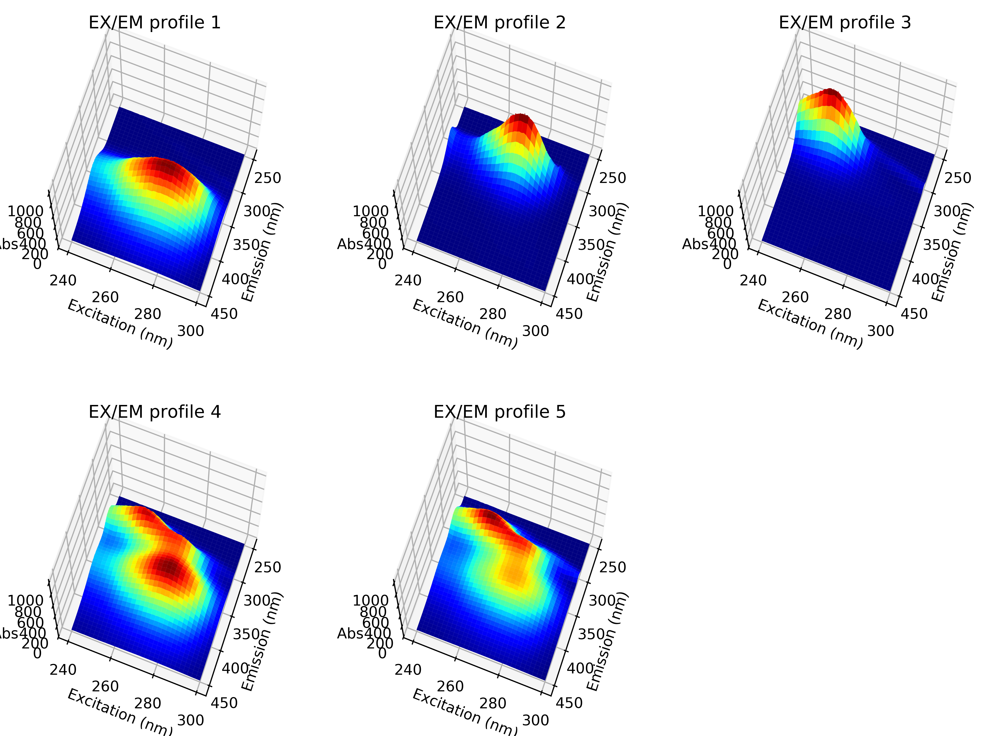

In [2]:
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D

# define meaningful z-axis limits for all plots
maxx = x.max() + x.max()*0.1
minn = x.min() - x.min()*0.1

# prepare for surface plotting
angle1, angle2 = 70, 20
mesh = np.meshgrid(emax, exax)
fig = plt.figure(figsize=(12,9), dpi=600)

# surf plot all 5 EX/EM profiles (samples)
for sample in range(x.shape[0]):
    ax = fig.add_subplot(2, 3, sample+1, projection='3d')
    ax.plot_surface(*mesh, x[sample,:,:], cmap=cm.jet)
    ax.view_init(angle1, angle2)
    ax.set_zlim(bottom=minn, top=maxx)
    ax.set_ylabel('Excitation (nm)')
    ax.set_xlabel('Emission (nm)') 
    ax.set_zlabel('Abs')
    ax.set_title("EX/EM profile %s" % str(sample+1))

From the figure above it appears that each of the 5 EX/EM profiles can be understood as a mixture (linear combination) of three underlying "factor landscapes". Ideally, each of these "factor landscapes" should be affiliated with one of the three amino acids. Hence, we expect three PARAFAC components to decribe the data. In addition, the model uniqueness property of PARAFAC should help to resolve these three amino acid profiles.

## Decompose the three-way tensor using PARAFAC!

For the following assume the notation of the decomposition as $\mathcal{X} = A  (B \odot C)^T + \mathcal{E}$, where $\mathcal{X}$, $A$, $B$, $C$ and $\mathcal{E}$ represent the three-way tensor, PARAFAC scores (sample mode loadings), loadings for the emission and excitation mode and residuals, respectively, and $\odot$ represents the Khatri-Rao product.

We use three components for the PARAFAC decomposition as discussed above.

In [3]:
from tensorly.decomposition import non_negative_parafac, parafac
# Define number of components
numcomp = 3

# random state is set to reproduce solution handout results
model1 = parafac(x, numcomp, init='random', random_state=2020)
loadings = model1[1]

# Alternatively, one could have also used non-negativ constrained PARAFAC
# loadings = non_negative_parafac(x, numcomp, init='svd')

## Plot all PARAFAC mode loadings ($A$, $B$ and $C$)! How do these relate to the 5 EX/EM profiles above? 

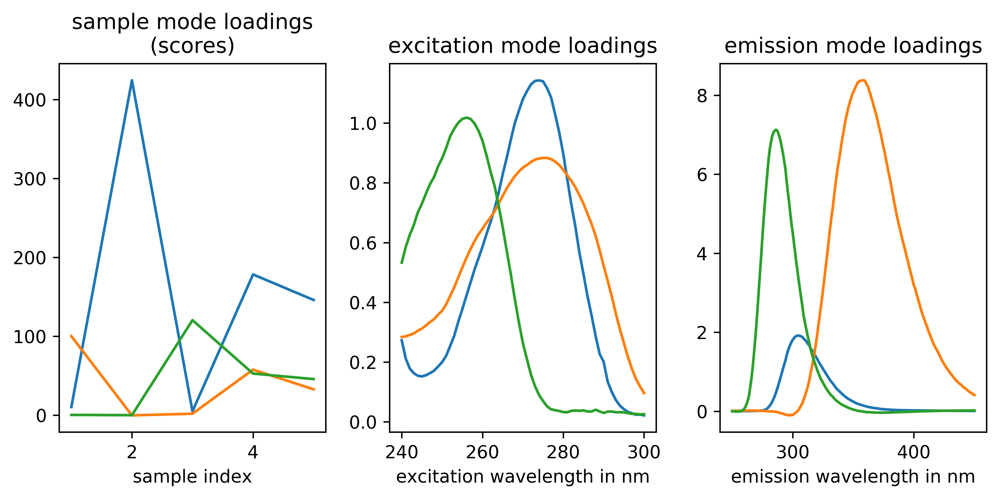

In [4]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(8,4), dpi=600)
ax[0].plot([1,2,3,4,5], loadings[0])
ax[0].set_title('sample mode loadings\n(scores)')
ax[0].set_xlabel('sample index')
ax[1].plot(exax[0,:], loadings[1]) 
ax[1].set_title('excitation mode loadings')
ax[1].set_xlabel('excitation wavelength in nm')
ax[2].plot(emax[0,:], loadings[2])
ax[2].set_title('emission mode loadings')
ax[2].set_xlabel('emission wavelength in nm')
plt.tight_layout()

The PARAFAC loadings are visualized in the figure above with orange, green and blue indicating components one, two and three. If PARAFAC should succeed to resolve the three amino acid EX/EM patterns the three loadings in the emission and excitation mode should resemble pure profiles for the respective amino acids. As a consequence, the PARAFAC scores (sample mode) should ideally represent how strong the individual amino acids contribute to the overall EX/EM profiles seen in the figure from question 2. 

**Extra**: Non-negativity constraints could have been applied for this decomposition (`non_negative_parafac`), i.e. to force EX and EM loadings to be strictly positive. This would make sense as EX/EM profiles are by nature only positive.

## Scatter plot the PARAFAC scores versus the appropriate known amino acid concentrations! 

**Hint**: You are expected to obtain three scatter plots here, one for each amino acid.

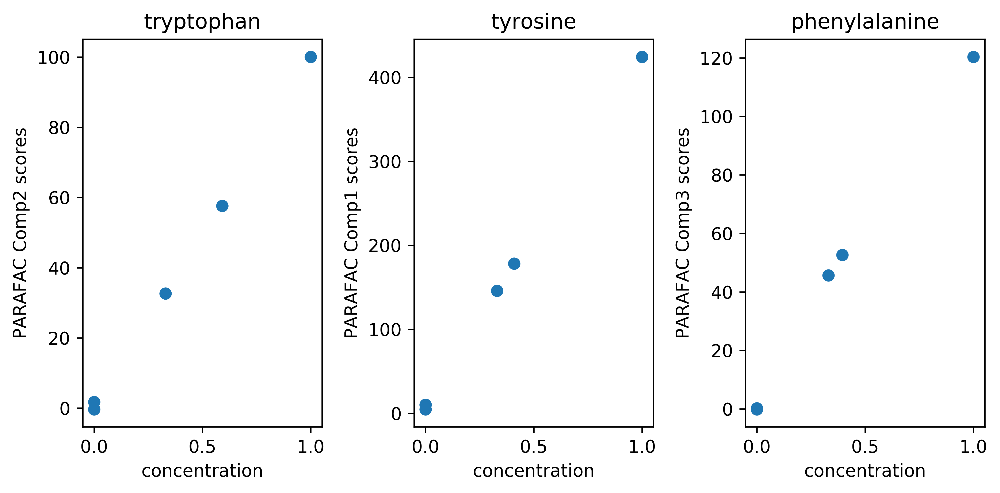

In [5]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(8,4), dpi=600)
ax[0].scatter(amino_conc[:,0] / amino_conc[:,0].max(), loadings[0][:,1])
ax[0].set_title(colnames_amino[0])
ax[0].set_xlabel('concentration')
ax[0].set_ylabel('PARAFAC Comp2 scores')
ax[1].scatter(amino_conc[:,1] / amino_conc[:,1].max(), loadings[0][:,0])
ax[1].set_title(colnames_amino[1])
ax[1].set_xlabel('concentration')
ax[1].set_ylabel('PARAFAC Comp1 scores')
ax[2].scatter(amino_conc[:,2] / amino_conc[:,2].max(), loadings[0][:,2])
ax[2].set_title(colnames_amino[2])
ax[2].set_xlabel('concentration')
ax[2].set_ylabel('PARAFAC Comp3 scores')
plt.tight_layout()

Scatter plotting the sample mode scores of the three components against the affiliated amino acid concentration shows that PARAFAC succeeded to resolve the three amino acid patterns (see figure above). Very high correlations can be observed for all three amino acids.

## Compute the outer vector products $b_ic_i^T$ for all PARAFAC components $1, 2, ..., I$  and surface plot the result!

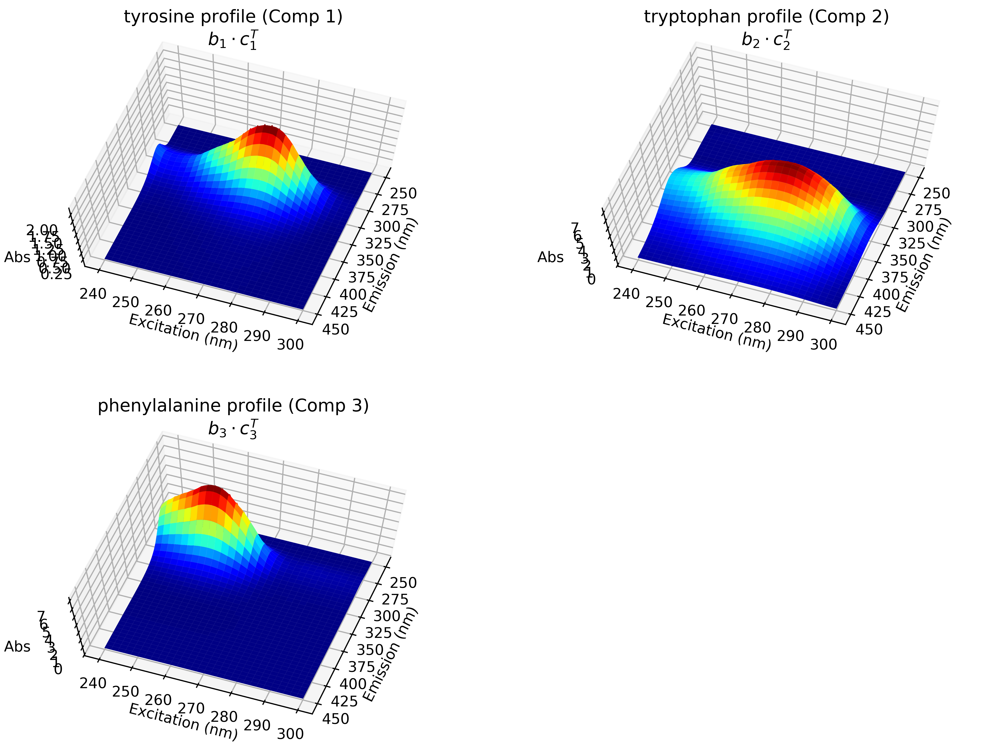

In [6]:
fig = plt.figure(figsize=(12,9), dpi=600)
aminos_reordered = [colnames_amino[1], colnames_amino[0], colnames_amino[2]]
for comp in range(numcomp):
    outerprod = (loadings[1][:,comp:comp+1]).dot(loadings[2][:,comp:comp+1].T)
    ax = fig.add_subplot(2, 2, comp+1, projection='3d')
    ax.plot_surface(*mesh, outerprod, cmap=cm.jet)
    ax.view_init(angle1,angle2)
    ax.set_ylabel('Excitation (nm)')
    ax.set_xlabel('Emission (nm)') 
    ax.set_zlabel('Abs')
    ax.set_title('%s profile (Comp %d)\n$b_%d \\cdot c_%d^T$' 
                 % (aminos_reordered[comp], comp+1, comp+1, comp+1))
    

As discussed previously the emission and excitation mode loadings should represent the three individual amino acids in the three components. Hence, the outer vector products $b_ic_i^T$ - where $i$ counts from component 1 to 3 - should represent the pure amino acid "factor landscapes". This can be seen in the figure above. All three outer vector products appear "pure" and we can therefore conclude that our 3 component PARAFAC model has succeeded to resolve the three amino acid profiles. This is in agreement with the conclusion from the previous question.

## Reconstruct the 5th EX/EM profile using the PARAFAC model and surface plot the result!

We are interested to obtain the tensor reconstruction $\mathcal{\hat{X}}$. Coding-wise this can be achieved in three ways:

A) We can directly use the PARAFAC model as described above to get $\mathcal{\hat{X}} = A  (B \odot C)^T$

B) We can understand the reconstruction as a linear combination of the three pure amino acid profiles (figure above) which need to be scaled by the respective sample mode scores.

C) We can simply use the `kruskal_to_tensor` function.

The resulting surface plot of the 5th reconstructed sample can be seen in the figure below. All three implementations yield the same solution.

Text(0.5,0.92,'PARAFAC reconstruction sample 5')

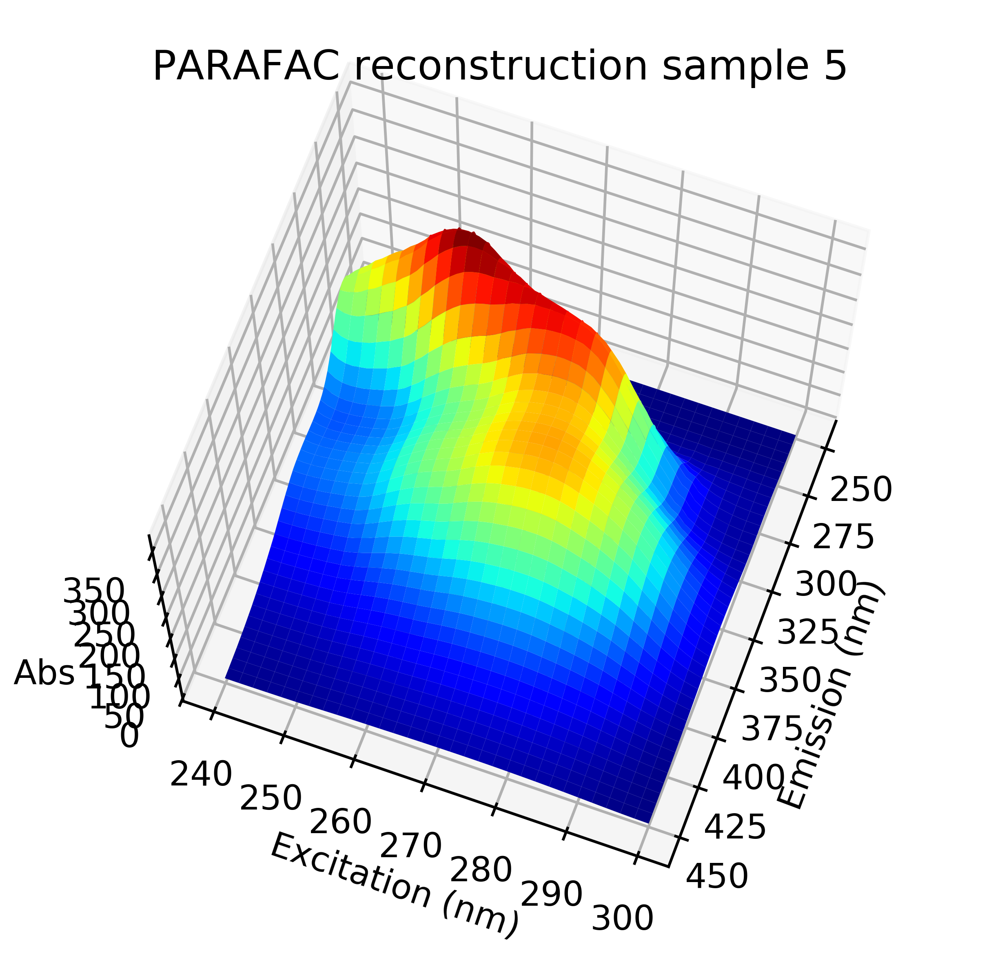

In [7]:
# reconstruct sample 5 from PARAFAC model
sample = 4
a = loadings[0]
b = loadings[1]
c = loadings[2]

## this can be done in three ways (A, B and C)
# A) Using Khatri-Rao formula
from tensorly.tenalg import khatri_rao
from tensorly import fold
recon1 = fold(a.dot((khatri_rao((b,c))).T), mode=0, shape=x.shape)[sample,:,:]

# B) as linear combination of outer vector products (scaled by respective scores)
recon = a[sample,0]*b[:,0:1].dot(c[:,0:1].T) + a[sample,1]*b[:,1:2].dot(c[:,1:2].T) + a[sample,2]*b[:,2:3].dot(c[:,2:3].T)

# C) simply apply kruskal_tensor function
from tensorly import kruskal_to_tensor
recon = kruskal_to_tensor(model1)[sample,:,:]

# surface plot reconstructed sample
fig = plt.figure(figsize=(5,5), dpi=600)
ax = fig.add_subplot(1, 1, 1, projection='3d')
ax.plot_surface(*mesh, recon1, cmap=cm.jet)
ax.view_init(angle1, angle2)
ax.set_ylabel('Excitation (nm)')
ax.set_xlabel('Emission (nm)') 
ax.set_zlabel('Abs')
ax.set_title('PARAFAC reconstruction sample %s' % str(sample+1))


## Reconstruct the 5th sample using the PARAFAC model, but remove the tyrosine signals! Surface plot the result!

Again, we are interested to obtain the tensor reconstruction $\mathcal{\hat{X}}$, but this time we would like to remove the tyrosine signals. 

The resulting surface plot of the fifth reconstructed sample can be seen in the figure below (right subplot). The result is the same as seen in the previous figure, but the tyrosine signals have dissappeared. For comparison see the original reconstructed sample in the left subplot of the figure below. This example should underline why PARAFAC is used a lot for multivariate curve resolution.

Text(0.5,0.92,'PARAFAC reconstruction sample 5 without Tyr signals')

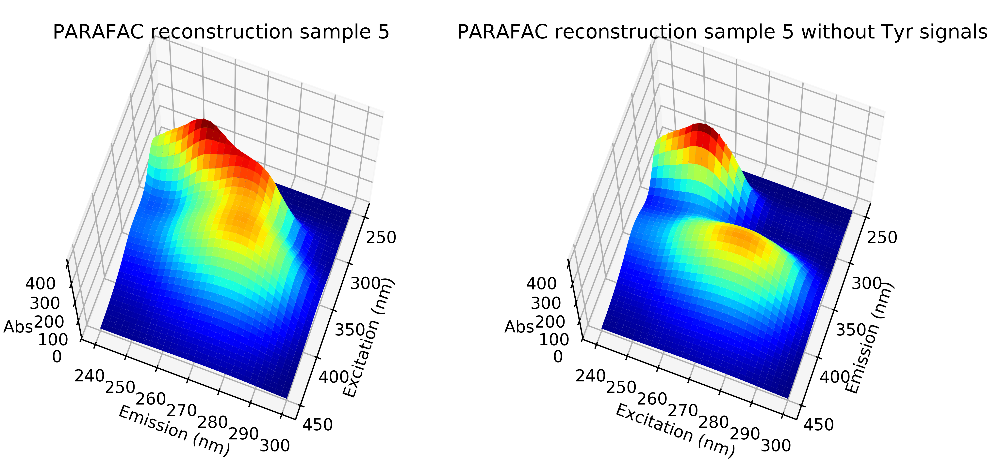

In [8]:
# reconstruct sample 5 from PARAFAC model without Tyr signals
# as linear combination of outer vector products, but remove tyr component!
recon2 = a[sample,1]*b[:,1:2].dot(c[:,1:2].T) + a[sample,2]*b[:,2:3].dot(c[:,2:3].T)

# define meaningful z-axis limits for all plots
maxx = recon1.max() + recon1.max()*0.1
minn = recon1.min() - recon1.min()*0.1

# surface plot recon1
fig = plt.figure(figsize=(10,5), dpi=600)
ax = fig.add_subplot(1, 2, 1, projection='3d')
ax.plot_surface(*mesh, recon1, cmap=cm.jet)
ax.view_init(angle1, angle2)
ax.set_zlim(bottom=minn, top=maxx)
ax.set_xlabel('Excitation (nm)')
ax.set_ylabel('Emission (nm)') 
ax.set_zlabel('Abs')
ax.set_title('PARAFAC reconstruction sample %s' % str(sample+1))

# surface plot recon2
ax = fig.add_subplot(1, 2, 2, projection='3d')
ax.plot_surface(*mesh, recon2, cmap=cm.jet)
ax.view_init(angle1, angle2)
ax.set_zlim(bottom=minn, top=maxx)
ax.set_ylabel('Excitation (nm)')
ax.set_xlabel('Emission (nm)') 
ax.set_zlabel('Abs')
ax.set_title('PARAFAC reconstruction sample %s without Tyr signals' % str(sample+1))


## (Optional) Compute the core tensor, such that $\mathcal{G} = \mathcal{X} \times_1 A^{-1} \times_2 B^{-1} \times_3 C^{-1}$. 

**Hint**: Use the function `multi_mode_dot` for sequential calculation of n-mode products.

The n-mode product is used to perform this calculation in a straight forward manner (using `multi_mode_dot`). The resulting core tensor $\mathcal{G}$ is shown below the code chunk. One can observe that the PARAFAC assumption of a superdiagonal core tensor is approximately met because only the super diagonal elements are close to one, while the remaining elements are close to zero.

In [9]:
from tensorly.tenalg import multi_mode_dot
g = multi_mode_dot(x, [np.linalg.pinv(loadings[0]), 
                            np.linalg.pinv(loadings[1]), 
                            np.linalg.pinv(loadings[2])],
                   modes=[0,1,2])
print(g)


[[[ 1.02993895e+00 -3.56409461e-03 -7.39528520e-03]
  [-3.56468903e-02  4.88991656e-03  8.93946593e-03]
  [ 8.45763522e-03 -2.15880044e-03 -1.94590832e-03]]

 [[-1.01487107e-01  9.57904896e-03 -1.42962539e-02]
  [ 1.06382687e-01  9.89024373e-01  1.57955892e-02]
  [-1.30354476e-02  2.64971722e-03 -3.89695084e-03]]

 [[-4.53252602e-02 -5.37327075e-03  1.80288316e-02]
  [ 5.60353651e-02  4.80445985e-03 -2.13728293e-02]
  [-1.32310627e-02  4.41996216e-04  1.00455585e+00]]]


## (Optional) Calculate the core consistency diagnostic (corcondia - CCD), such that $CCD = 100 \cdot (1 - \frac{||\mathcal{I} - \mathcal{G}||_F^2}{||\mathcal{I}||_F^2})$)! What is the purpose of the CCD? 

**Hint**: $\mathcal{I}$ represents a perfect super-diagonal core tensor, i.e. it contains ones along its diagonal and zeros otherwise.

To obtain a meaningful PARAFAC model, i.e. yielding a unique solution, one can use the so called core consistency diagnostics (CCD - CORDCONDIA). By doing so, we compare our core tensor $\mathcal{G}$ with a super diagonal core tensor $\mathcal{I}$ (best case scenario). If the resulting CCD is close to 100% we are happy, otherwise you might want to tweak the number of components used in your model. Additional pre-processing can also improve your data's fitness to be modeled using PARAFAC. However, this is not part of this course.

The CCD value is given below. As expected it is close to 100%.

In [10]:
i = np.zeros((numcomp, numcomp, numcomp))   
for comp in range(numcomp): i[comp, comp, comp] = 1
ccd = 100*(1-((i-g)**2).sum()/(i**2).sum())

print('CCD = %.2f percent' % ccd)

CCD = 98.96 percent


## (Optional) Unfold the data and perform PCA! Can three PCA components resolve the three amino acids? Does PCA yield a unique solution?

PCA was performed on unfolded and mean-centered data. The resulting PCA scores of the three components are shown in the figure below. As it can be seen in the figure below PCA did not succeed to resolve the three amino acid profiles.

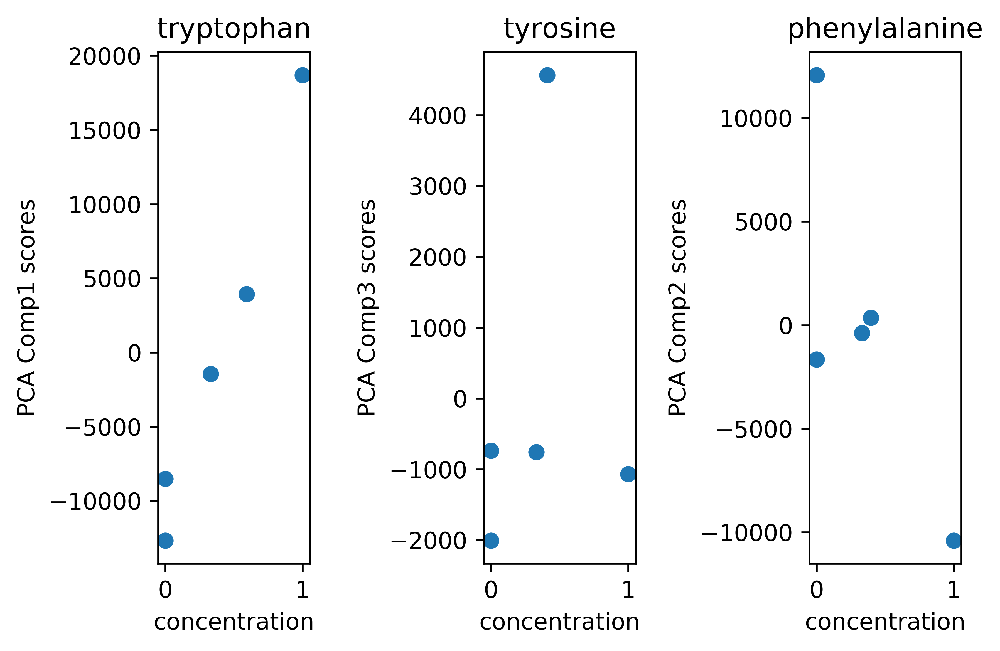

In [11]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from tensorly import unfold

# Unfold, mean-center and perform PCA
x_unfold = unfold(x, mode=0)
scaler1 = StandardScaler(with_mean=True, with_std=False)
model2 = PCA(numcomp)
pca_scores = model2.fit_transform(scaler1.fit_transform(x_unfold))

# scatter PCA scores against known (normalized) Amino acid concentrations
fig, ax = plt.subplots(nrows=1, ncols=3, dpi=600)
ax[0].scatter(amino_conc[:,0]/ amino_conc[:,0].max(), pca_scores[:,0])
ax[0].set_title(colnames_amino[0])
ax[0].set_xlabel('concentration')
ax[0].set_ylabel('PCA Comp1 scores')
ax[1].scatter(amino_conc[:,1] / amino_conc[:,1].max(), pca_scores[:,2])
ax[1].set_title(colnames_amino[1])
ax[1].set_xlabel('concentration')
ax[1].set_ylabel('PCA Comp3 scores')
ax[2].scatter(amino_conc[:,2] / amino_conc[:,2].max(), pca_scores[:,1])
ax[2].set_title(colnames_amino[2])
ax[2].set_xlabel('concentration')
ax[2].set_ylabel('PCA Comp2 scores')
plt.tight_layout()

Let's look at the three "factor landscapes" obtained by PCA (figure below). To visualize the PCA "factor landscapes" we have to re-fold the loadings. Again, it can be observed that PCA did not succeed in resolving the pure amino acid profiles. 

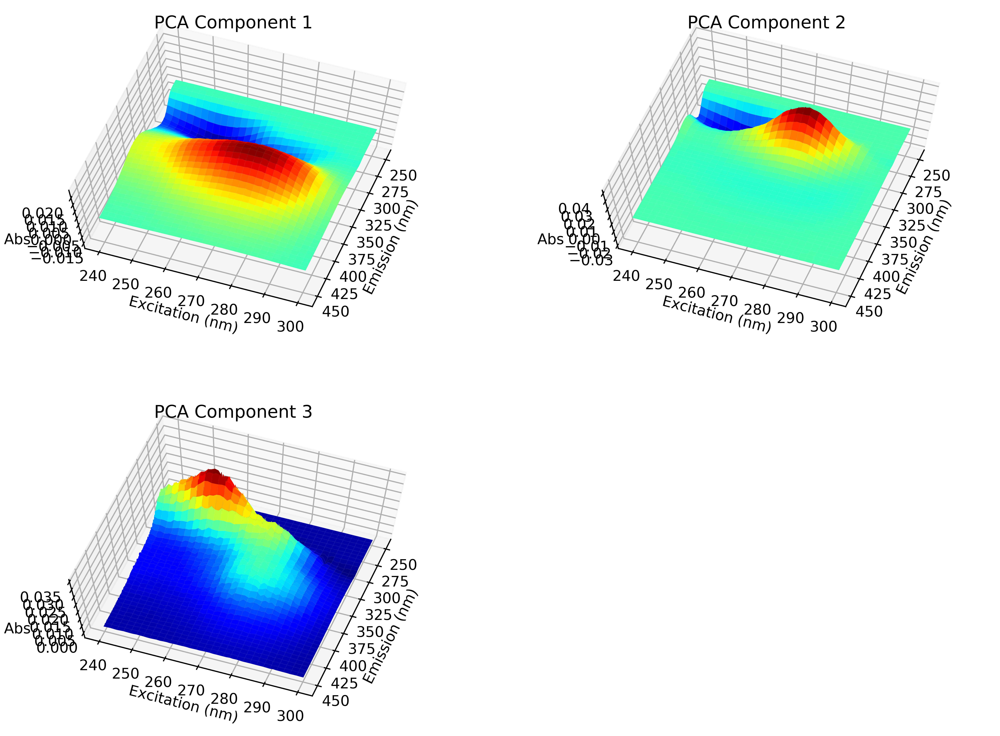

In [12]:
fig = plt.figure(figsize=(12,9), dpi=600)
for comp in range(numcomp):
    # re-fold PCA component loading
    pca_comp_landscape = model2.components_[comp,:].reshape((61,201))
    ax = fig.add_subplot(2, 2, comp+1, projection='3d')
    ax.plot_surface(*mesh, pca_comp_landscape, cmap=cm.jet)
    ax.view_init(angle1, angle2)
    ax.set_ylabel('Excitation (nm)')
    ax.set_xlabel('Emission (nm)') 
    ax.set_zlabel('Abs')
    ax.set_title('PCA Component %s' % str(comp+1))
    



PCA does not yield an unique solution, i.e. PCA model represenations are rotational ambiguous. 